# Samuel Amat

# Ecuaciones diferenciales en una dimensión

Recordemos que una ecuación diferencial general con una variable ("en una dimensión") se ve así:

$$ \dot{x} = f(x, t), $$

o sea

$$ \dot{x}(t) = f(x(t), t) \qquad \text{para toda $t$}.$$

La primera ecuación describe la igualdad de dos *funciones*, y la segunda de *dos números*.

En este curso, usaremos el paquete `DifferentialEquations.jl` para resolver ecuaciones diferenciales ordinarias:

    Pkg.add("DifferentialEquations")
    
Luego

    Pkg.status("DifferentialEquations")
    
debería indicar que estás utilizando la versión 4.0 o más alto. Esto es importante, ya que cambió la sintaxis del paquete en la versión 4.0

**[1]** (i) Revisar la documentación del paquete.

(ii) Utilízalo para integrar la ecuación logística, que modela la dinámica de crecimiento de una población en tiempo continuo:

$$\dot{x} = x \, (1-x)$$

Dibuja soluciones para distintas condiciones iniciales como función del tiempo, así como el campo vectorial correspondiente [con la función `quiver` de `Plots.jl`]. 

(iii) Encuentra visual- / gráficamente los **puntos fijos** y su estabilidad.

### Solución

In [1]:
using DifferentialEquations
using Plots
plotly()
#gr()
#Pkg.status("DifferentialEquations")

Plots.PlotlyBackend()

In [2]:
f(x, p, t) = x*(1-x)
x0=1/2
tspan = (0.0,5.0)
sols = []
for x0 in 0.0:0.1:2
    prob = ODEProblem(f,x0,tspan)
    sol = solve(prob)
    push!(sols, sol)
end
x0=1
plot(sols[1], lw=2, xaxis="t", yaxis="x(t)", label="x₀=0.1")
for i in 2:20
    X0 = trunc(i*0.1,2)
    plot!(sols[i], lw=2, label="x₀=$X0")
end
current()

In [3]:
X = linspace(0, 2, 20) 
T = linspace(0, 10, 20)
df(t, x) = P2(1, x*(1 - x))/2 #el factor 1/2 es para escalar el tamaño de las flechas
pts = vec(P2[(T[i], X[j]) for i=1:length(T), j=1:length(X)]) 
quiver(pts, quiver=df, marker=(10,stroke(0.5,0.5)), xlabel = "tiempo", ylabel = "x(t)")

#### Vemos de las dos gráficas de arriba que $x=0$ es un punto fijo y también que $x=1$ lo es, también de la gráfica del campo vectorial se observa que $x=1$ es un punto fijo estable, ya que el campo en ptos cercanos se ve atraído hacia éste. Mientras que $x=0$ parece inestable, ya que puntos cercanos se alejan.

**[2]** (i) ¿Qué ecuación satisface un punto fijo $x^*$ de una ecuación diferencial ordinaria en una variable que no dependa explícitamente del tiempo, es decir $\dot{x} = f(x)$?

(ii) Haz un análisis de estabilidad lineal: perturba $x^*$ con un $\delta x_0$ y averigua cómo crece $\delta x(t)$ como función del tiempo. ¿De qué depende?

(iii) ¿Cómo puedes encontrar numéricamente los puntos fijos y su estabilidad?

### Solución

un punto $x^*$ es fijo si satisface que: $$f(x^*) = 0 \qquad(1)$$

Además, podemos definir una perturbación $\delta(t)$ cómo:

$$\delta(t) = x(t) - x^*$$

Para observar cómo es la dinámica de $\delta$ derivemos la ecuación anterior.

$$\dot{\delta} = \dfrac{d}{dt}\left(x(t)-x^* \right) = \dfrac{dx(t)}{dt} - 0 = \dot{x} = f(x) = f(x^* + \delta(t))$$

Expandiendo en Taylor alrededor de $x^*$ se obtiene:

$$f(x^* + \delta) = f(x^*) + \delta f'(x^*) + O(\delta^2) \qquad(2)$$

Usando $1$, a primer orden $2$ queda como:

$$\dot{\delta(t)} = f'(x^*) \delta(t)$$

La solución a esta ecuación diferencial es:

$$\boxed{\delta(t) = ce^{f'(x^*)t}} \qquad(3)$$

Con $c$ una constante

Vemos que para $f'(x^*) \in \left(-\infty, 0\right)$, $\delta(t)$ converge a $0$, mientras que para $f'(x^*) \in \left(0, \infty \right)$, $\delta(t)$ diverge.

#### Concluimos que para encontrar numéricamente los puntos fijos $x^*$ basta encontrar los ceros de $\dot{x} = f(x)$ digamos con Newton y para evaluar la estabilidad basta fijarnos en el valor de $f'(x^*)$. Para $f'(x^*) < 0$ tendrémos ptos fijos estables y para $f'(x^*)>0$ serán ptos fijos inestables.

## Ecuaciones con parámetros 

El interés en estos sistemas surge cuando hay parámetros:

$$\dot{x} = f_\mu(x),$$

ya que entonces pueden surgir bifurcaciones.

**[3]** Para las siguientes ecuaciones:

(i) Investiga la dinámica resolviendo las ecuaciones numéricamente y encuentra el (los) valor(es) crítico(s) $\mu_c$ en donde ocurran la(s) bifurcacion(es) (e.g. con `@manipulate`). Dibuja la dinámica como función del tiempo para distintas condiciones iniciales, en tres gráficas diferentes: $\mu < \mu_c$, $\mu = \mu_c$ y $\mu > \mu_c$.

(ii) Encuentra numéricamente los puntos fijos y su estabilidad como función de $\mu$. Dibuja el diagrama de bifuraciones (posición de las $x^*(\mu)$ en función de $\mu$), dibujando puntos estables e inestables con marcadores de tipo diferente.

(iii) Describe en palabras qué ocurre en la bifurcación.

Para hacerlo, escribe funciones que acepten la $f$ y lleven a cabo el análisis correspondiente y dibujen las figuras.

Las ecuaciones por investigar son:

- $\dot{x} = \mu + x^2$

- $\dot{x} = \mu x - x^2$

- $\dot{x} = \mu*x - x^3$

- $\dot{x} = \mu*x + x^3 - x^5$


### Solución

In [1]:
function Newton(g, derivada_g, y0, n=100)
    y = zeros(n)
    y[1] = y0 - g(y0)/derivada_g(y0)
    for i in 1:n-1
        y[i+1] = y[i] - g(y[i])/derivada_g(y[i])
    end
    return y[end]
end

Newton (generic function with 2 methods)

In [ ]:
f1(u, μ) = [μ-(u[1])^2, u[2]]
J1(u, μ) = [-2*u[1] 0.;0. 1.])
for μ in rango_μ
    pto_fijo = Newton(x->(f(x,μ)), y->(derivada_f(y,μ)), x0)
    @show pto_fijo
end

In [5]:
function estabilidad(f, derivada_f, x0, rango_μ)
    estables = []
    rango_estables = []
    inestables = []
    rango_inestables = []
    for μ in rango_μ
        pto_fijo = Newton(x->(f(x,μ)), y->(derivada_f(y,μ)), x0)
        if abs(f(pto_fijo, μ)) < 1e-4
            if derivada_f(pto_fijo, μ) < 0
                push!(estables, pto_fijo)
                push!(rango_estables, μ)
            elseif derivada_f(pto_fijo, μ) > 0
                push!(inestables, pto_fijo)
                push!(rango_inestables, μ)
                else nothing
            end
            else nothing
        end
    end
    return rango_estables, estables, rango_inestables, inestables
end

estabilidad (generic function with 1 method)

In [6]:
function dinamica_bifurcacion(f, μ_critico, a, b, h, rango_t)
    μ = μ_critico + 1
    tspan = rango_t
    rango_x0 = a:h:b
    sols = []
    for x0 in rango_x0
        prob = ODEProblem((x,p,t)->f(x,p,t,μ), x0, tspan)
        sol = solve(prob,Tsit5(),reltol=1e-8,abstol=1e-8)
        push!(sols, sol)
    end
    X0 = collect(rango_x0)[1]
    plot(sols[1], lw=2, xaxis="t", yaxis="x(t)", label="x₀=$X0", title="μ = $μ")
    contador = collect(rango_x0)[1]
    for i in 2:length(rango_x0)
        contador += h
        X0 = trunc(contador, 2)
        plot!(sols[i], lw=2, label="x₀ = $X0")
    end
    p1 = current();

    μ = μ_critico
    sols = []
    for x0 in rango_x0
        prob = ODEProblem((x,p,t)->f(x,p,t,μ), x0, tspan)
        sol = solve(prob,Tsit5(),reltol=1e-8,abstol=1e-8)
        push!(sols, sol)
    end
    plot(sols[1], lw=2, xaxis="t", yaxis="x(t)", label="", title="μ = $μ")
    for i in 2:length(rango_x0)
        plot!(sols[i], lw=2, label="")
    end
    p2 = current();

    μ = μ_critico - 1
    sols = []
    for x0 in rango_x0
        prob = ODEProblem((x,p,t)->f(x,p,t,μ), x0, tspan)
        sol = solve(prob,Tsit5(),reltol=1e-8,abstol=1e-8)
        push!(sols, sol)
    end
    plot(sols[1], lw=2, xaxis="t", yaxis="x(t)", label="", title="μ = $μ")
    for i in 2:length(rango_x0)
        plot!(sols[i], lw=2, label="")
    end
    p3 = current();

    plot(p3, p2, p1, layout=(1,3), size=(1000, 400))
end

dinamica_bifurcacion (generic function with 1 method)

In [7]:
function diagrama_bifurcacion(f, derivada_f, rango_μ, rango_x0, bandera="scatter")
    plot()
    for x0 in rango_x0
        ptos_fijos = estabilidad(f, derivada_f, x0, rango_μ);
        if bandera == "scatter"
            scatter!(ptos_fijos[1], ptos_fijos[2], xlabel="μ", ylabel="puntos fijos",
            label="", marker=:square)
            scatter!(ptos_fijos[3], ptos_fijos[4], linestyle=:dash, label="",
            title="diagrama de bifurcaciones", marker=:cross)#, size=(800, 600))
            else 
            plot!(ptos_fijos[1], ptos_fijos[2], xlabel="μ", ylabel="puntos fijos",
            label="", lw=2)
            plot!(ptos_fijos[3], ptos_fijos[4], linestyle=:dash, label="", lw=2,
            title="diagrama de bifurcaciones")#, size=(800, 600))
        end
    end
    current()
end

diagrama_bifurcacion (generic function with 2 methods)

## $\dot{x} = \mu + x^2$:

In [8]:
using Interact
@manipulate for μ in -5:0.1:5
    f(x,p,t) = μ + x^2
    tspan = (0.0,1.0)
    sols = []
    rango_x0 = 0.0:0.01:0.1 
    for x0 in rango_x0
        prob = ODEProblem(f,x0,tspan)
        sol = solve(prob,Tsit5(),reltol=1e-8,abstol=1e-8)
        push!(sols, sol)
    end
    plot(sols[1], lw=2, xaxis="t", yaxis="x(t)", label="")
    for i in 2:length(rango_x0)
        plot!(sols[i], lw=2, label="")
    end
    current()
end

Interact.Options{:SelectionSlider,Float64}(1: "input" = 0.0 Float64 , "μ", 0.0, "0.0", 51, Interact.OptionDict(DataStructures.OrderedDict("-5.0"=>-5.0,"-4.9"=>-4.9,"-4.8"=>-4.8,"-4.7"=>-4.7,"-4.6"=>-4.6,"-4.5"=>-4.5,"-4.4"=>-4.4,"-4.3"=>-4.3,"-4.2"=>-4.2,"-4.1"=>-4.1…), Dict(1.2=>"1.2",4.3=>"4.3",-2.3=>"-2.3",2.0=>"2.0",1.5=>"1.5",-1.3=>"-1.3",-3.4=>"-3.4",1.4=>"1.4",-2.2=>"-2.2",-3.0=>"-3.0"…)), Any[], Any[], true, "horizontal", true)

 #### Con @manipulate encontré que $\mu = 0$ es un punto de bifurcación, abajo se muestran tres dinámicas distintas para varias condiciones iniciales $x_0 \in \{0, 0.01, \ldots , 0.1\}$ pero para valores de $\mu<0$, $\mu=0$ y $\mu>0$

In [9]:
f(x,p,t,μ) = μ + x^2
a = 0.0
h = 0.01
b = 0.1
rango_t = (0.0,1.0)
μ_critico = 0
dinamica_bifurcacion(f, μ_critico, a, b, h, rango_t)

#### A continuación el campo y diagrama de bifurcaciones:
los cuadros/linea_lisa corresponden a puntos fijos estables y las cruces/linea_punteada a puntos fijos inestables.

In [10]:
@manipulate for μ in -1:0.1:1
    X = linspace(-2, 2, 20) 
    T = linspace(0, 10, 20)
    df(t, x) = P2(1,μ + x^2)/4
    pts = vec(P2[(T[i], X[j]) for i=1:length(T), j=1:length(X)])
    p2 = quiver(pts, quiver=df, marker=(10,stroke(0.5,0.5)), xlabel = "tiempo", ylabel = "x(t)", color = "blue", 
    title = "campo vectorial")
end

Interact.Options{:SelectionSlider,Float64}(5: "input-2" = 0.0 Float64 , "μ", 0.0, "0.0", 11, Interact.OptionDict(DataStructures.OrderedDict("-1.0"=>-1.0,"-0.9"=>-0.9,"-0.8"=>-0.8,"-0.7"=>-0.7,"-0.6"=>-0.6,"-0.5"=>-0.5,"-0.4"=>-0.4,"-0.3"=>-0.3,"-0.2"=>-0.2,"-0.1"=>-0.1…), Dict(1.0=>"1.0",0.3=>"0.3",-0.2=>"-0.2",-1.0=>"-1.0",-0.3=>"-0.3",-0.6=>"-0.6",0.7=>"0.7",0.0=>"0.0",0.2=>"0.2",-0.1=>"-0.1"…)), Any[], Any[], true, "horizontal", true)

In [11]:
f(x,μ) = μ + x^2
df(x,μ) = 2*x
rango_μ = -10.0:0.01:10
rango_x0 = [-1,1]
diagrama_bifurcacion(f, df, rango_μ, rango_x0, "")

#### Usando el diagrama de bifurcaciones y el campo de velocidades notamos lo siguiente:
#### $\mu<0$: 
hay dos ptos fijos: uno estable y otro inestable, la dinámica será distinta si nos encontramos dentro de la región que encierra la paŕabola, aquí la dinámica converge al punto fijo estable correspondiente (sobre la línea lisa). Para c.i. arriba de la línea punteada, la dínamica diverge y para c.i debajo de la línea lisa, la dinámica converge al pto fijo estable correspondiente.
#### $\mu=0$:
los dos puntos fijos anteriores coalescen a un pto fijo (que parece meta-estable) en $x^*=0$ (esto se observa en el campo de velocidades)
#### $\mu>0$:
No hay puntos fijos!

## $\dot{x} = \mu x - x^2$:

In [12]:
@manipulate for μ in -5:0.1:5
    f(x,p,t) = μ*x - x^2
    tspan = (0.0,10.0)
    sols = []
    for x0 in 0.0:0.01:0.1
        prob = ODEProblem(f,x0,tspan)
        sol = solve(prob,Tsit5(),reltol=1e-8,abstol=1e-8)
        push!(sols, sol)
    end
    plot(sols[1], lw=2, xaxis="t", yaxis="x(t)", label="")
    for i in 2:11
        plot!(sols[i], lw=2, label="")
    end
    current()
end

Interact.Options{:SelectionSlider,Float64}(9: "input-3" = 0.0 Float64 , "μ", 0.0, "0.0", 51, Interact.OptionDict(DataStructures.OrderedDict("-5.0"=>-5.0,"-4.9"=>-4.9,"-4.8"=>-4.8,"-4.7"=>-4.7,"-4.6"=>-4.6,"-4.5"=>-4.5,"-4.4"=>-4.4,"-4.3"=>-4.3,"-4.2"=>-4.2,"-4.1"=>-4.1…), Dict(1.2=>"1.2",4.3=>"4.3",-2.3=>"-2.3",2.0=>"2.0",1.5=>"1.5",-1.3=>"-1.3",-3.4=>"-3.4",1.4=>"1.4",-2.2=>"-2.2",-3.0=>"-3.0"…)), Any[], Any[], true, "horizontal", true)


#### Nuevamente se encuentra que $\mu = 0$ es un punto de bifurcación, abajo las dinámicas alrededor de $\mu=0$

In [13]:
f(x,p,t,μ) = μ*x - x^2
a = 0.0
h = 0.01
b = 0.1
rango_t = (0.0,10.0)
μ_critico = 0
dinamica_bifurcacion(f, μ_critico, a, b, h, rango_t)

#### Abajo el diagrama de bifurcaciones

In [14]:
@manipulate for μ in -1:0.1:1
    X = linspace(-2, 2, 20) 
    T = linspace(0, 10, 20)
    df(t, x) = P2(1,μ*x - x^2)/4
    pts = vec(P2[(T[i], X[j]) for i=1:length(T), j=1:length(X)])
    p2 = quiver(pts, quiver=df, marker=(10,stroke(0.5,0.5)), xlabel = "tiempo", ylabel = "x(t)", color = "blue", 
    title = "campo vectorial")
end

Interact.Options{:SelectionSlider,Float64}(13: "input-4" = 0.0 Float64 , "μ", 0.0, "0.0", 11, Interact.OptionDict(DataStructures.OrderedDict("-1.0"=>-1.0,"-0.9"=>-0.9,"-0.8"=>-0.8,"-0.7"=>-0.7,"-0.6"=>-0.6,"-0.5"=>-0.5,"-0.4"=>-0.4,"-0.3"=>-0.3,"-0.2"=>-0.2,"-0.1"=>-0.1…), Dict(1.0=>"1.0",0.3=>"0.3",-0.2=>"-0.2",-1.0=>"-1.0",-0.3=>"-0.3",-0.6=>"-0.6",0.7=>"0.7",0.0=>"0.0",0.2=>"0.2",-0.1=>"-0.1"…)), Any[], Any[], true, "horizontal", true)

In [15]:
f(x,μ) = μ*x - x^2
df(x,μ) = μ - 2*x
rango_μ = -1:0.05:1
rango_x0 = [-1,1]
diagrama_bifurcacion(f, df, rango_μ, rango_x0, "")

#### Usando el diagrama de bifurcaciones y el campo de velocidades notamos lo siguiente:
#### $\mu<0$: 
hay dos ptos fijos: uno estable y otro inestable, la dinámica será distinta si nos encontramos dentro de la región que encierra las dos rectas, aquí la dinámica converge al punto fijo estable correspondiente (sobre la línea lisa). Para c.i. debajo de la línea punteada, la dínamica diverge y para c.i arriba de la línea lisa, la dinámica converge al pto fijo estable correspondiente.
#### $\mu=0$:
los dos puntos fijos anteriores coalescen a un pto fijo (que parece meta-estable) en $x^*=0$ (esto se observa en el campo de velocidades) y se intercambia el tipo de estabilidad de ambos ptos fijos.
#### $\mu>0$:
nuevamente hay dos ptos fijos: la dinámica será análoga a la de $\mu<0$, solo que ahora se intercambia la estabilidad

## $\dot{x} = \mu x - x^3$:

In [16]:
@manipulate for μ in -5:0.1:5
    f(x,p,t) = μ*x - x^3
    tspan = (0.0,10.0)
    sols = []
    for x0 in 0.0:0.01:0.1
        prob = ODEProblem(f,x0,tspan)
        sol = solve(prob,Tsit5(),reltol=1e-8,abstol=1e-8)
        push!(sols, sol)
    end
    plot(sols[1], lw=2, xaxis="t", yaxis="x(t)", label="")
    for i in 2:11
        plot!(sols[i], lw=2, label="")
    end
    current()
end

Interact.Options{:SelectionSlider,Float64}(17: "input-5" = 0.0 Float64 , "μ", 0.0, "0.0", 51, Interact.OptionDict(DataStructures.OrderedDict("-5.0"=>-5.0,"-4.9"=>-4.9,"-4.8"=>-4.8,"-4.7"=>-4.7,"-4.6"=>-4.6,"-4.5"=>-4.5,"-4.4"=>-4.4,"-4.3"=>-4.3,"-4.2"=>-4.2,"-4.1"=>-4.1…), Dict(1.2=>"1.2",4.3=>"4.3",-2.3=>"-2.3",2.0=>"2.0",1.5=>"1.5",-1.3=>"-1.3",-3.4=>"-3.4",1.4=>"1.4",-2.2=>"-2.2",-3.0=>"-3.0"…)), Any[], Any[], true, "horizontal", true)

#### Nuevamente $\mu=0$ es bifurcación, abajo las dinámicas

In [17]:
f(x,p,t,μ) = μ*x - x^3
a = 0.0
h = 0.01
b = 0.1
rango_t = (0.0,10.0)
μ_critico = 0
dinamica_bifurcacion(f, μ_critico, a, b, h, rango_t)

#### Abajo el diagrama de bifurcación

In [18]:
@manipulate for μ in -2:0.1:2
    X = linspace(-2, 2, 20) 
    T = linspace(0, 10, 20)
    df(t, x) = P2(1, μ*x - x^3)/6
    pts = vec(P2[(T[i], X[j]) for i=1:length(T), j=1:length(X)])
    p2 = quiver(pts, quiver=df, marker=(10,stroke(0.5,0.5)), xlabel = "tiempo", ylabel = "x(t)", color = "blue", 
    title = "campo vectorial")
end

Interact.Options{:SelectionSlider,Float64}(21: "input-6" = 0.0 Float64 , "μ", 0.0, "0.0", 21, Interact.OptionDict(DataStructures.OrderedDict("-2.0"=>-2.0,"-1.9"=>-1.9,"-1.8"=>-1.8,"-1.7"=>-1.7,"-1.6"=>-1.6,"-1.5"=>-1.5,"-1.4"=>-1.4,"-1.3"=>-1.3,"-1.2"=>-1.2,"-1.1"=>-1.1…), Dict(1.0=>"1.0",0.3=>"0.3",1.2=>"1.2",2.0=>"2.0",-0.2=>"-0.2",-1.0=>"-1.0",1.5=>"1.5",-1.3=>"-1.3",-0.3=>"-0.3",-0.6=>"-0.6"…)), Any[], Any[], true, "horizontal", true)

In [19]:
f(x,μ) = μ*x - x^3
df(x,μ) = μ - 3*x^2
rango_μ = -1:0.05:1
rango_x0 = -1:0.2:1
diagrama_bifurcacion(f, df, rango_μ, rango_x0)

#### Usando el diagrama de bifurcaciones y el campo de velocidades notamos lo siguiente:
#### $\mu<0$: 
hay un ptos fijo estable en $x=0$, aquí las soluciones convergen a ese pto fijo.
#### $\mu=0$:
El punto fijo bifurca en tres puntos fijos uno inestable en $x=0$ y dos estables. 
#### $\mu>0$:
Hay tres puntos fijos, dos estables y uno inestable en $x=0$. Si nos ubicamos dentro de la región de la parábola dada por las dos ramas estables, ahí las soluciones convergen a $x=0$. Si estamos por abajo entonces convergen al pto estable correspondiente en la rama de abajo y si estamos arriba convergen al otro punto fijo estable.

## $\dot{x} = \mu x + x^3 - x^5$:


In [20]:
@manipulate for μ in -5:0.1:5
    f(x,p,t) = μ*x - x^3
    tspan = (0.0,10.0)
    sols = []
    for x0 in 0.0:0.01:0.1
        prob = ODEProblem(f,x0,tspan)
        sol = solve(prob,Tsit5(),reltol=1e-8,abstol=1e-8)
        push!(sols, sol)
    end
    plot(sols[1], lw=2, xaxis="t", yaxis="x(t)", label="")
    for i in 2:11
        plot!(sols[i], lw=2, label="")
    end
    current()
end

Interact.Options{:SelectionSlider,Float64}(25: "input-7" = 0.0 Float64 , "μ", 0.0, "0.0", 51, Interact.OptionDict(DataStructures.OrderedDict("-5.0"=>-5.0,"-4.9"=>-4.9,"-4.8"=>-4.8,"-4.7"=>-4.7,"-4.6"=>-4.6,"-4.5"=>-4.5,"-4.4"=>-4.4,"-4.3"=>-4.3,"-4.2"=>-4.2,"-4.1"=>-4.1…), Dict(1.2=>"1.2",4.3=>"4.3",-2.3=>"-2.3",2.0=>"2.0",1.5=>"1.5",-1.3=>"-1.3",-3.4=>"-3.4",1.4=>"1.4",-2.2=>"-2.2",-3.0=>"-3.0"…)), Any[], Any[], true, "horizontal", true)

#### Nuevamente $\mu=0$ es bifurcación

In [21]:
f(x,p,t,μ) = μ*x + x^3 - x^5
a = 0.0
h = 0.01
b = 0.1
rango_t = (0.0,10.0)
μ_critico = 0
dinamica_bifurcacion(f, μ_critico, a, b, h, rango_t)

#### abajo el campo y las bifurcaciones

In [22]:
@manipulate for μ in -1:0.1:1
    X = linspace(-1, 1, 20) 
    T = linspace(0, 20, 20)
    df(t, x) = P2(1, μ*x + x^3 - x^5)/2
    pts = vec(P2[(T[i], X[j]) for i=1:length(T), j=1:length(X)])
    p2 = quiver(pts, quiver=df, marker=(10,stroke(0.5,0.5)), xlabel = "tiempo", ylabel = "x(t)", color = "blue", 
    title = "campo vectorial")
end

Interact.Options{:SelectionSlider,Float64}(29: "input-8" = 0.0 Float64 , "μ", 0.0, "0.0", 11, Interact.OptionDict(DataStructures.OrderedDict("-1.0"=>-1.0,"-0.9"=>-0.9,"-0.8"=>-0.8,"-0.7"=>-0.7,"-0.6"=>-0.6,"-0.5"=>-0.5,"-0.4"=>-0.4,"-0.3"=>-0.3,"-0.2"=>-0.2,"-0.1"=>-0.1…), Dict(1.0=>"1.0",0.3=>"0.3",-0.2=>"-0.2",-1.0=>"-1.0",-0.3=>"-0.3",-0.6=>"-0.6",0.7=>"0.7",0.0=>"0.0",0.2=>"0.2",-0.1=>"-0.1"…)), Any[], Any[], true, "horizontal", true)

In [23]:
f(x,μ) = μ*x + x^3 - x^5
df(x,μ) = μ + 3*x^2 - 5*x^4
rango_μ = -1:0.05:1
rango_x0 = -1:0.5:1
diagrama_bifurcacion(f, df, rango_μ, rango_x0)

#### Usando el diagrama de bifurcaciones y el campo de velocidades notamos lo siguiente:
#### $\mu<0$: 
para $-0.77<\mu<0$ hay cinco ptos fijos; dos inestables y tres estables, para $-\infty<\mu<-0.7$ sólo el hay un pto fijo estable en $x=0$
#### $\mu=0$:
$x=0$ pasa de ser estable a ser inestable y las dos ramas de puntos estables se mantienen
#### $\mu>0$:
Hay tres puntos fijos, $x=0$ inestable y dos ramas estables

**[4]** Después de llevar a cabo este notebook, lee el capítulo 3 del Strogatz y reproduce alguno de los análisis de los sistemas físicos / biológicos.

### Solución

Se va analizar el modelo propuesto por Ludwig et al. (1978) para estudiar la interacción de una plaga de palomillas con los bosques de Canadá.
La ecuación diferencial a tratar es:
\begin{eqnarray}
\dot{N} = RN\left(1- \dfrac{N}{K}\right) - \dfrac{BN^2}{A^2 + N^2} \qquad(1)
\end{eqnarray}
el primer sumando representa un crecimiento logísitico de la población de palomillas, con parámetro de crecimiento $R$ mientras que el segundo sumando representa una taza de muerte debido a depredadores de palomillas.

Adimencionalizando la ecuación $1$ definiendo los siguientes parámetros:
\begin{eqnarray}
x = \dfrac{N}{A} \\
\tau = \dfrac{Bt}{A} \\
r = \dfrac{RA}{B} \\
k = \dfrac{K}{A}
\end{eqnarray}
La ecuación $1$ queda cómo:
\begin{eqnarray}
\boxed{
\dot{x} = rx \left( 1 -\dfrac{x}{k} \right)
- \dfrac{x^2}{1 + x^2} \qquad(2)}
\end{eqnarray}

Notemos que $x^* = 0$ es un punto fijo de $2$.

Los otros puntos fijos, son los que satisfacen 
$$ rx \left( 1 -\dfrac{x^*}{k} \right) = \dfrac{x^{*2}}{1 + x^{*2}} \qquad(3) $$


Dado que la dinámica depende de dos parámetros $r$ y $k$ dibujaremos los diagramas de bifurcación en función  de $r$ y $k$ por separado, a continuación se presenta el diagrama para $k$:

In [24]:
@manipulate for r in 0:0.1:0.8, k in 0:1:10
    X = linspace(-1, 1, 20) 
    T = linspace(0, 20, 20)
    df(t, x) = P2(1, r*x*(1-x/k) - (x^2)/(1+x^2))/2
    pts = vec(P2[(T[i], X[j]) for i=1:length(T), j=1:length(X)])
    p2 = quiver(pts, quiver=df, marker=(10,stroke(0.5,0.5)), xlabel = "tiempo", ylabel = "x(t)", color = "blue", 
    title = "campo vectorial")
end

Interact.Options{:SelectionSlider,Float64}(33: "input-9" = 0.4 Float64 , "r", 0.4, "0.4", 5, Interact.OptionDict(DataStructures.OrderedDict("0.0"=>0.0,"0.1"=>0.1,"0.2"=>0.2,"0.3"=>0.3,"0.4"=>0.4,"0.5"=>0.5,"0.6"=>0.6,"0.7"=>0.7,"0.8"=>0.8), Dict(0.0=>"0.0",0.4=>"0.4",0.3=>"0.3",0.7=>"0.7",0.5=>"0.5",0.2=>"0.2",0.1=>"0.1",0.8=>"0.8",0.6=>"0.6")), Any[], Any[], true, "horizontal", true)

Interact.Options{:SelectionSlider,Int64}(35: "input-10" = 5 Int64 , "k", 5, "5", 6, Interact.OptionDict(DataStructures.OrderedDict("0"=>0,"1"=>1,"2"=>2,"3"=>3,"4"=>4,"5"=>5,"6"=>6,"7"=>7,"8"=>8,"9"=>9…), Dict(2=>"2",0=>"0",7=>"7",9=>"9",10=>"10",8=>"8",6=>"6",4=>"4",3=>"3",5=>"5"…)), Any[], Any[], true, "horizontal", true)

In [25]:
f(x, r, k) = r*x*(1-x/k) - (x^2)/(1+x^2)
df(x, r, k) = r*(1-x/k) - r*x*(1/k) - ((2*x/(1+x^2)) - (2*x^3)/((1+x^2)^2))
rango_k = linspace(1,40, 20)
rango_r = linspace(0, 1, 20)
rango_x0 = linspace(0, 40, 100)
@manipulate for r0 in rango_r, k0 in rango_k
    plt1 = diagrama_bifurcacion((x,k)->(f(x,r0,k)), (x,k)->(df(x,r0,k)), rango_k, rango_x0);
    plt2 = diagrama_bifurcacion((x,r)->(f(x,r,k0)), (x,r)->(df(x,r,k0)), rango_r, rango_x0);
    plot(plt1, plt2)
end
#current()

Interact.Options{:SelectionSlider,Float64}(39: "input-11" = 0.47368421052631576 Float64 , "r0", 0.47368421052631576, "0.47368421052631576", 10, Interact.OptionDict(DataStructures.OrderedDict("0.0"=>0.0,"0.05263157894736842"=>0.0526316,"0.10526315789473684"=>0.105263,"0.15789473684210525"=>0.157895,"0.21052631578947367"=>0.210526,"0.2631578947368421"=>0.263158,"0.3157894736842105"=>0.315789,"0.3684210526315789"=>0.368421,"0.42105263157894735"=>0.421053,"0.47368421052631576"=>0.473684…), Dict(1.0=>"1.0",0.0526316=>"0.05263157894736842",0.947368=>"0.9473684210526315",0.789474=>"0.7894736842105263",0.0=>"0.0",0.368421=>"0.3684210526315789",0.263158=>"0.2631578947368421",0.894737=>"0.8947368421052632",0.526316=>"0.5263157894736842",0.473684=>"0.47368421052631576"…)), Any[], Any[], true, "horizontal", true)

Interact.Options{:SelectionSlider,Float64}(41: "input-12" = 19.473684210526315 Float64 , "k0", 19.473684210526315, "19.473684210526315", 10, Interact.OptionDict(DataStructures.OrderedDict("1.0"=>1.0,"3.0526315789473686"=>3.05263,"5.105263157894737"=>5.10526,"7.157894736842105"=>7.15789,"9.210526315789474"=>9.21053,"11.263157894736842"=>11.2632,"13.31578947368421"=>13.3158,"15.368421052631579"=>15.3684,"17.42105263157895"=>17.4211,"19.473684210526315"=>19.4737…), Dict(19.4737=>"19.473684210526315",40.0=>"40.0",3.05263=>"3.0526315789473686",15.3684=>"15.368421052631579",9.21053=>"9.210526315789474",31.7895=>"31.789473684210527",11.2632=>"11.263157894736842",17.4211=>"17.42105263157895",25.6316=>"25.63157894736842",33.8421=>"33.8421052631579"…)), Any[], Any[], true, "horizontal", true)

La gráfica de la izquierda muestra los cortes sobre el plano $x^*-r$ y los de la derecha muestran los cortes sobre el plano $x^*-k$. Ambos son cortes de la superficie que se genera al graficar $x^* = x^* \left(k,r\right)$. Esta gráfica dice mucho sobre el comportamiento de los puntos fijos, por ejemplo. si nos fijamos en los cortes en k y nos colocamos en aprox $k<5$, $k>5$, vemos que la gráfica se encima y aparacen ptos fijos inestables entre lo que antes era una gráfica continua de ptos. fijos estables. Esto define una discontinuidad en la superficie de ptos. fijos y se conoce como cúspide de superficie catastrófica. Indica un salto abrupto en la dinámica del sistema.

In [26]:
xmin = 1
xmax = 40
xvec = linspace(xmin, xmax, 1000)
r(x) = (2*x^3)/((1+x^2)^2);
k(x) = (2*x^3)/((x^2)-1);
plot(k.(xvec), r.(xvec), xlims=(0,40), ylabel="r", xlabel="k", title="bifurcaciones en forma parámetrica (k(x), r(x))",
lw=2)

De la gráfica en forma parámetrica también es posible observar la discontinuidad justo en el pico, ya que el comportamiento de la dinámica por abajo de la linea inferior corresponde a un refugio de la plaga de palomillas respecto a depredadores externos y el comportamiento por arriba de la línea superior corresponde a un brote de las palomillas, es decir, para un cierto valor de $(k,r) \approx (5, 0.6)$ se puede pasar a un brote espontáneo de palomillas cuando antes había una escasez de las mismas. Esta es la discontinuidad de la que se habló arriba.

**[5]** ¡Dibuja la figura 3.7.6 del Strogatz!

A pesar de que lo intenté, no lo logré, pero espero que al menos el @manipulate donde están los cortes planos de cuenta de la dinámica.

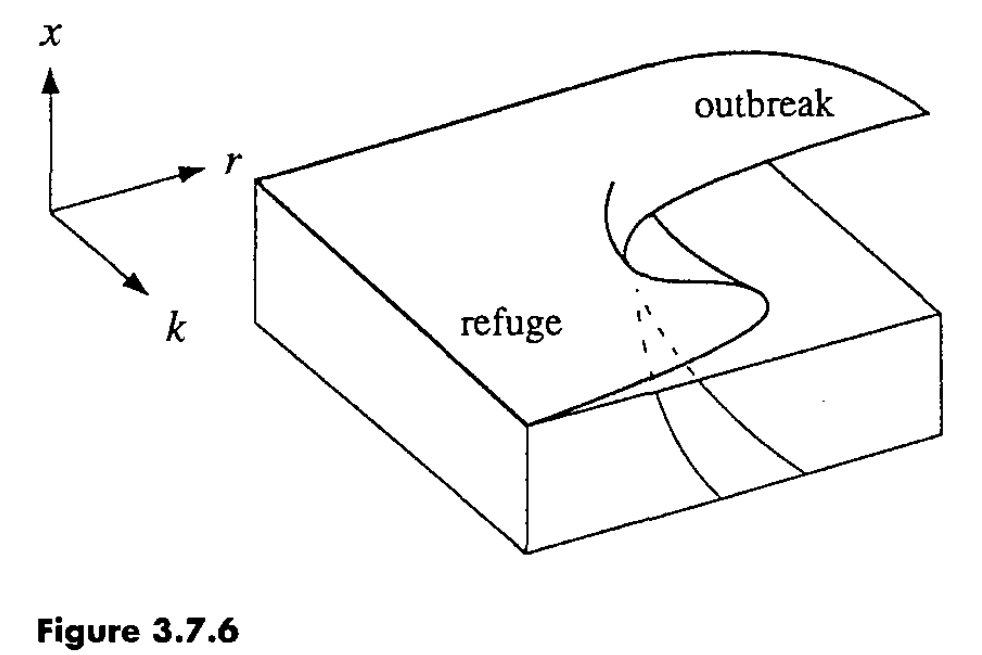

[6] Haz un resumen de lo que hayamos aprendido en este notebook.

### Solución.

Resolví ecuaciones diferenciales no lineales con el integrador de juliad DifferentialEquations.jl.

Logré graficar los campos vectoriales asociados a las trayectorias que son solución de dicha ecuación con quiver.jl

Interpreté el comportamiento que se observa al graficar tanto las soluciones como función del tiempo, como los campos vectoriales, logrando encontrar las bifurcaciones tanto cualitativamente (observando dichas gráficas) como cuantitattivamente, implementando una función que encuentra los ptos fijos los clasifica en estables e inestables y los grafica en función del parámetro.

A su vez, estudié una ecuación diferencial con dos parámetros y se hicieron los cortes por un plano de la superficie de puntos fijos, viendo que para ecuaciones que tienen más de un parámetro puede suceder que el comportamiento de las soluciones cambie drásticamente, que corresponde a una discontinuidad al recorrer la superficie de ptos fijos.